<a href="https://colab.research.google.com/github/tanvirkuet/Dog_Breed_identification/blob/master/my_first_dogvision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 ## This is my First Colab Notebook doing a project on dogvision
 Some resources for machine learning model
 1. https://paperswithcode.com/
 2. https://pytorch.org/hub/
 3. https://www.youtube.com/watch?v=oBklltKXtDE&feature=youtu.be&t=173
 4. https://tfhub.dev/
 5. https://modelzoo.co/
 6. https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html
 7. https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53
 8. https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c
 9. https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
 10. https://www.youtube.com/watch?v=R9OHn5ZF4Uo
 11. https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/
 12. https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard
 13. https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
 14. https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch
 






## Project folder has been set up, using google drive. could have used it via kaggle API

# Dog Vision project
This notebook builds an end-to-end **multi-class image classifier** using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
 * Identifying the breed of a dog,given an image of a dog.

 * if I saw a dog, I wll capture an image and do my model find the breed of that dog

* This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification.

## 2. Data
* Data is collected from a Kaggle competion
[Dog Breed Identification](https://www.kaggle.com/c/dog-breed-identification/data)

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

[Submission formate reference](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation
)
## 4. Feature 
Some information about the data:
* We're dealing with multi-class image classification problem (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes).So it is multi class
 (**My Heart disease project was binary classification because it has only two classes( disease and not disease.** *italicized text*)
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 




### Notes
Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:
1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model ([TensorFlow Hub](https://www.tensorflow.org/hub), `tf.keras.applications`, [TensorBoard](https://www.tensorflow.org/tensorboard), [EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).

For preprocessing our data, we're going to use TensorFlow 2.x. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub. 

The process of using a pretrained model and adapting it to your own problem is called **transfer learning**. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.

In [0]:
# Unzip the data uploaded on google drive.
#!unzip 'drive/My Drive/Colab Notebooks/kaggle/dog-breed-identification.zip' -d 'drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision'

## Getting Our workspace Ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
  * TensorFlow Hub is a repository of reusable assets for machine learning with TensorFlow. In particular, it provides pre-trained SavedModels that can be reused to solve new tasks with less training time and less training data.
[  https://github.com/tensorflow/hub](https://)

* Make sure we're using a GPU ✅

In [0]:
# import Tensorflow and Tensosorflow hub to colab

import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Checking GPU availabiity
print('GPU','available :)' if tf.config.list_physical_devices('GPU') else 'is not available :(' )

TF version: 2.2.0-rc3
TF Hub version: 0.8.0
GPU available :)


In [0]:
# if need another tf version
# Run this cell if TensorFlow 2.x isn't the default in Colab
# try:
#   # %tensorflow_version only exists in Colab
#   %tensorflow_version 2.x
# except Exception:
#   pass

## Getting our Darta Ready

* There are a few ways we could do this. Many of them are detailed in the [Google Colab notebook on I/O (input and output)](https://colab.research.google.com/notebooks/io.ipynb).
* Like all machine learning project, data needs to be numeric. So I am going to turn images into Tensors.(numerical formate (matrix)

* And because the data we're using is hosted on Kaggle, we could even use the [Kaggle API](https://www.kaggle.com/docs/api).

* 

Let's start by checking the labels

In [0]:
# # Running this cell will provide you with a token to link your drive to this notebook
# from google.colab import drive
# drive.mount('/content/drive')

In [0]:
import pandas as pd

labels_csv = pd.read_csv('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,19338a74e8e5a84e1c4bdd59309507a5,scottish_deerhound
freq,1,126


In [0]:
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


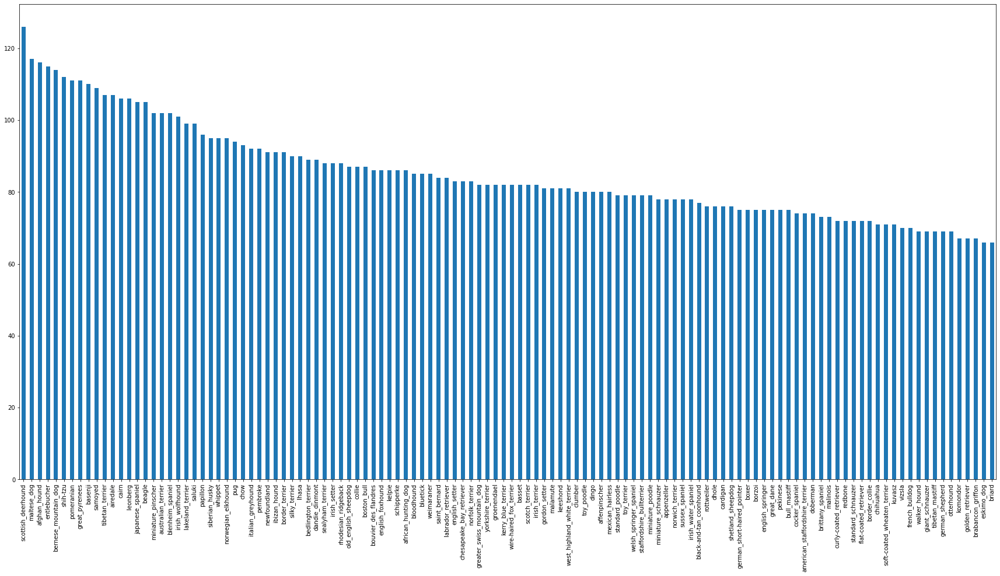

In [0]:
# How many images are there for each breed
labels_csv.breed.value_counts().plot.bar(figsize=(30,15));

In [0]:
labels_csv['breed'].value_counts().median()

82.0

we need at least 10 imaage ,100+ in recomended. for learnig. see link for details [Preparing your training data](https://cloud.google.com/vision/automl/object-detection/docs/prepare)

in here our data distribution is good.

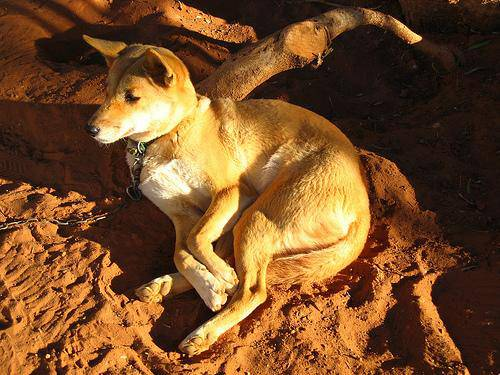

In [0]:
from IPython.display import Image
Image('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting Images & their labels

Let's get a list of all our image file path name

In [0]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Since we've got the image ID's and their labels in a DataFrame (`labels_csv`), we'll use it to create:
* A list a filepaths to training images
* An array of all labels
* An array of all unique labels

We'll only create a list of filepaths to images rather than importing them all to begin with. This is because working with filepaths (strings) is much efficient than working with images.

In [0]:
# Create pathnames from image ID's
filename = ['/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/'  + filename + '.jpg' for filename in labels_csv['id']]



filename[10220:]  # kaggle said it has 10222 files. I just checked that

['/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/ffe5f6d8e2bff356e9482a80a6e29aac.jpg',
 '/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/fff43b07992508bc822f33d8ffd902ae.jpg']

Now we've got a list of all the filenames from the ID column of `labels_csv`, we can compare it to the number of files in our training data directory to see if they line up.

If they do, great. If not, there may have been an issue when unzipping the data (what we did above), to fix this, you might have to unzip the data again. Be careful not to let your Colab notebook disconnect whilst unzipping.

In [0]:
import os
if len(os.listdir('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/')) == len(filename):
  print(f'filename matches the actual amount {len(filename)} as per kaggle')
else:  
  print(f'filename shortage than actual amount as per kaggle')



filename matches the actual amount 10222 as per kaggle


Note: Python - OS Module:
It is possible to automatically perform many operating system tasks. The OS module in Python provides functions for creating and removing a directory (folder), fetching its contents, changing and identifying the current 
directory, etc.
* The listdir() function returns the list of all files and directories in the specified directory.
 https://www.tutorialsteacher.com/python/os-module

In [0]:
os.listdir('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/')[:10]

['96c040dad1ec2e3305419e088a4fe17d.jpg',
 '9741efdd134f5b90d268e671b02f5a3a.jpg',
 '9629f46ec0bd1eae63121877c7d6787e.jpg',
 '95d1224b21964f4fd5a4033e3bf3384e.jpg',
 '985e9ae5e9382a61fc14d9ed109f2cff.jpg',
 '96ff29c52552cd25bb3b49b77a2fe32a.jpg',
 '9663beed651287e84f9ec04dfdb1aa1e.jpg',
 '98a75a5cafbc3855fb37474cb755f0f6.jpg',
 '97eaf551c872ffc382aacc77fd2766e9.jpg',
 '962c60cd9ad2e083547caa891ca0d466.jpg']

chesapeake_bay_retriever


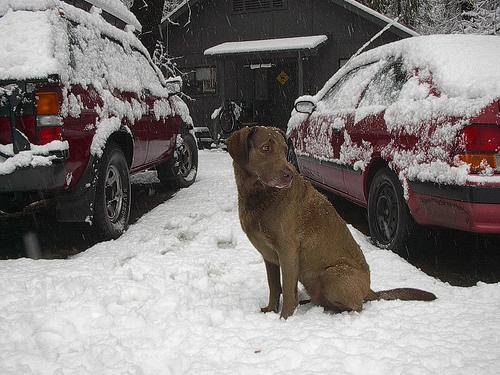

In [0]:
# Check an image directly from a filepath
print(labels_csv.breed[10221])
Image(filename[10221]) # the last image

### Preparing Labels
since we've now got our training image filepath in a list, let's prepare our labels
We'll take them from `labels_csv` and turn them into a NumPy array.

In [0]:
labels = labels_csv.breed
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [0]:
# Converting it to number
import numpy as np
# labels = np.array(labels)
#or we can do it like this
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [0]:
# Cheking for missing data
if len(labels) == len(filename):
  print(f'Number of filenamepath matches with labels {len(labels)}. We can proceed')
else:
  print(f'Nnmber of labels {len(labels)} and filename {len(filename)} does not matces')

Number of filenamepath matches with labels 10222. We can proceed


In [0]:
labels.dtype # those are string object


dtype('O')

In [0]:
# finding unique label value
unique_breed = np.unique(labels)
print(unique_breed)
len(unique_breed)  # 120 types breed as per kaggle

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

120

Why do it like this?

Remember, an important concept in machine learning is converting your data to numbers before passing it to a machine learning model.

In this case, we've transformed a single dog breed name such as `boston_bull` into a one-hot array. 

In [0]:
print(labels[0])
unique_breed == labels[0]

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

1. from 10000+ labels we created 10000+ arrays.
2. each array has one value 1(TRUE) but at different position
3. and there are 120 different position (unique_breed)
4. that means 120 class for multiclass classification
 

In [0]:
# Turn every labels in boolean array
boolean_labels = [ i == unique_breed for i in labels]
print(len(boolean_labels))
boolean_labels[:1]

NameError: ignored

In [0]:
## now example of turning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breed == labels[0])) # index where lable[0] occured
print(boolean_labels[0].argmax()) # where label occued in booleanarray
print(boolean_labels[0].astype(int))
unique_breed[19]


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


'boston_bull'

*Note**
* We made a array from 10k+ labels & then find the unique type 120 type in `unique_breed`.
* after comapring 10k+ label with 120 type we get 10k+ array where one 1 is present in each array
* position of this `1` represents the type in 120 types
*  `boolean_labels[0].argmax()` is `19`
* `unique_breed` `19` index named the type of dog


In [0]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [0]:
filename[:2]

['/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

## Creating our Valdation set
### Set up X & y

In [0]:
X = filename
y = boolean_labels

We are going to start our experiment with 1000 sample to saave time
* Checkout the magic function forms like the slider here https://colab.research.google.com/notebooks/forms.ipynb

In [0]:
# set number of images for experimenting
NUM_IMAGES = 1000 # @param {type:'slider', min:1000, max:10000,step:1000}
NUM_IMAGES

1000

###  Spliting  data

In [0]:
# Let's Split the data
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state = 42)   # we may also use tarin_size
len(X_train),len(X_val), len(y_train),len(y_val)

(800, 200, 800, 200)

In [0]:
X_train[:2], y_train[:2]

(['/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Data ( Turning images into Tensors) 

Our labels are in numeric format but our images are still just file paths.

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

To preprocess our data we will write a function which will do the below tasks:
1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable,  'image'
3. turn our 'image' (a jpg) into Tensors
4. Converting colour chanel value from 0-255 to 0-1 called normalization
5. Resize the image to a shape of (224,224)
6. return the modified image

Reference :
            1. https://www.tensorflow.org/tutorials/load_data/images)
            2. https://www.tensorflow.org/guide/data


Before we do, Let's see what importing an image looks like


In [0]:
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape


(257, 350, 3)

In [0]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [0]:
image.max(), image.min() # due to RGB colur chanel max is 255 and min is 0

(255, 0)

In [0]:
# converting to tensors
tf.constant(image)[:2]
# same like array but it is tensor and can be processed in GPU

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

### Function to process image


In [0]:
# Define image size
IMG_SIZE = 224

#Creating funtion
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Take an image file path and turns image into tensors and resize it.
  '''
  # Read image file
  image = tf.io.read_file(image_path)

  # turning jpeg image into numerical Tesors with 3 colour RGB channel
  image = tf.image.decode_jpeg(image,channels=3)

  # Converting colour chanel value from 0-255 to 0-1 called normalization.
  image = tf.image.convert_image_dtype(image,dtype=tf.float32)

  # Resize the image to our desired value
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

### Turning Data into batches

Wonderful. Now we've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow [`BatchDataset`](https://www.tensorflow.org/guide/data#batching_dataset_elements)).

What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

Let's say you're dealing with 10,000+ images (which we are). Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of `process_image` function at the same time.
Tf documentation says it is goog to use batch. should use batch size of 32

Why turning Data into batches??

Let's say we are trying to process 10000+ images at one go... they might not fit into model

So that's why, we do about 32 images at time called batch size. manual adjustment of batch size can be done if needed

in order to use tf efffectively, we need our data in the form of tensor tuples looks like this:
`(image,label)`



### Functoin to return a tuples

In [0]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path,label):

  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)

  return image,label

In [0]:
process_image(X[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [0]:
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

### Function to create Batches
Now we got a way to turn our data into tuples of Tensors in the form `(image,label)`, lets make a funtion to turn all of our data (`X` & `y`) into batches

* Because we'll be dealing with 3 different sets of data (training, validation and test), we'll make sure the function can accomodate for each set.

We'll set a default batch size of 32 because [according to Yann Lecun](https://twitter.com/ylecun/status/989610208497360896?s=20) (one of the OG's of deep learning), friends don't let friends train with batch sizes over 32.

In [0]:
# Create a Function to write data into batches
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE,valid_data=False, test_data=False ):
  '''
  Create a batch of data out of image (X) and  label (y) pairs.
  Shuffles the data if it is training data but does not shuffles for validation data.
  Also accept test data as input.
  '''
  # if the data is test data, we may not have any labels
  if test_data:
    print('Creating test data batches..')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepath(no label)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # if data is validation we don't need to shuffle it
  elif valid_data:
    print('Creating valid data batches..')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch
 
  else:
    # turn filepath into Tensors
    print('Creating Trainig data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # shufling pathname and labels  before mapping image processor function is faster than shuffling image
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples( this also process the image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch 

In [0]:
train_data = create_data_batches(X_train,y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating Trainig data batches
Creating valid data batches..


In [0]:
# different atributes of our databatces
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Look at that! We've got our data in batches, more specifically, they're in Tensor pairs of (images, labels) ready for use on a GPU.

But having our data in batches can be a bit of a hard concept to understand. Let's build a function which helps us visualize what's going on under the hood.
### Visulization

In [0]:
# create a function for visualization image
import matplotlib.pyplot as plt
import numpy as np


def show_25_image(images,labels):
    plt.figure(figsize=(10,10))
    for i in range(25):
        ax = plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.title(unique_breed[labels[i].argmax()])
        plt.axis('off')



To make computation efficient, a batch is a tighly wound collection of Tensors.

So to view data in a batch, we've got to unwind it.

We can do so by calling the [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator) method on a data batch.

This will turn our a data batch into something which can be iterated over.

Passing an iterable to [`next()`](https://docs.python.org/3/library/functions.html#next) will return the next item in the iterator.

In our case, next will return a batch of 32 images and label pairs.

**Note:** Running the cell below and loading images may take a little while.

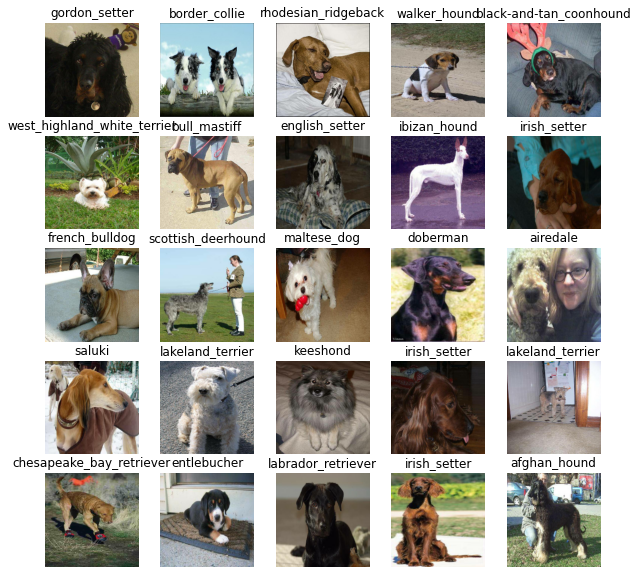

In [0]:
train_image, train_label = next(train_data.as_numpy_iterator())
type(train_image)
show_25_image(train_image,train_label)


**Note:** validation showing same image because. we shuffled train dataset. test and validation were not shuffled

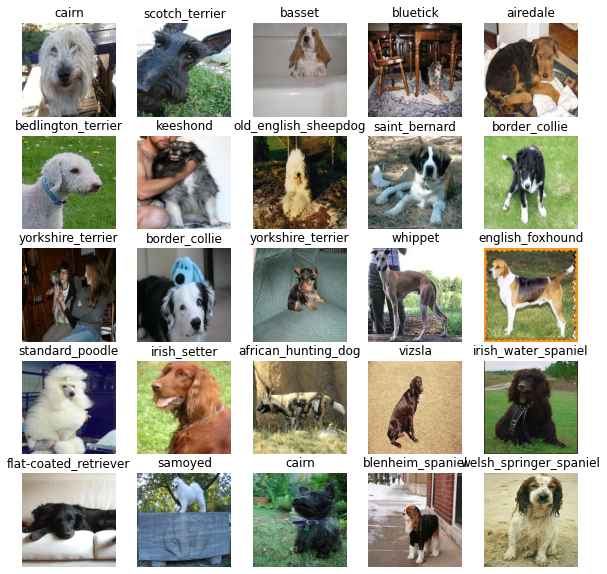

In [0]:
valid_image, valid_label = next(valid_data.as_numpy_iterator())
show_25_image(valid_image,valid_label)

# Creating and training a model

Now our data is ready, let's prepare it modelling. We'll use an existing model from [TensorFlow Hub](https://tfhub.dev/).

TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

Using a pretrained machine learning model is often referred to as **transfer learning**.

#### Why use a pretrained model?

Building a machine learning model and training it on lots from scratch can be expensive and time consuming.

Transfer learning helps eliviate some of these by taking what another model has learned and using that information with your own problem.

#### How do we choose a model?

Since we know our problem is image classification (classifying different dog breeds), we can navigate the [TensorFlow Hub page by our problem domain (image)](https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent). 

We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, [image classification](https://tfhub.dev/s?module-type=image-classification).

Doing this gives a list of different pretrained models we can apply to our task.

Clicking on one gives us information about the model as well as instructions for using it.

For example, clicking on the [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) model, tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Let's try it out.

## Building Model

before start few things need to define:

1. input shape(our images shape,in the form of Tensors) to our model
2. output shape(our images label,in the form of Tensors) to our model
3. URL of the model we want to use  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [0]:
# Setup input shape to our model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3] # [batch, height,width, colour channel ]

#Setup Output shape of model
OUTPUT_SHAPE = len(unique_breed)

# Setup URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

## Keras Deep learning model
Now we have input,output and model url, Let's put it together into a keras deep learning model

Let's create a function which:
1. takes the input shape, output shape and the model we have choosen as parameters

2. Define the layers in a Keras model in sequential fashion ( do this first, then this and then this type)

3. compiles the model (says it should be evaluated and improved)

4. Builds the model (tells the model the input shape it's going to take).

5. Return the model

* All of this can be found here
https://www.tensorflow.org/guide/keras/overview

In [0]:
# Create a  function to c build keras model

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url= MODEL_URL):
  print('Building model with:', MODEL_URL)

  # setup model Layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation='softmax') # Layer 2 ( output layer)                               
                               ])

 
  # Compile the model
  model.compile(
      optimizer = tf.keras.optimizers.Adam(),
      loss = tf.keras.losses.CategoricalCrossentropy(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

  
   


What's happening here?

### Setting up the model layers

There are two ways to do this in Keras, the [functional](https://www.tensorflow.org/guide/keras/functional) and [sequential API](https://www.tensorflow.org/guide/keras/overview#build_a_simple_model). We've used the sequential.

Which one should you use?

The Keras documentation states the functional API is the way to go for defining complex models but the sequential API (a linear stack of layers) is perfectly fine for getting started, which is what we're doing.

1. The first layer we use is the model from TensorFlow Hub (`hub.KerasLayer(MODEL_URL)`. So our first layer is actually an entire model (many more layers). This **input layer** takes in our images and finds patterns in them based on the patterns [`mobilenet_v2_130_224`](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) has found.

2. The next layer (`tf.keras.layers.Dense()`) is the **output layer** of our model. It brings all of the information discovered in the input layer together and outputs it in the shape we're after, 120 (the number of unique labels we have)

3. The `activation="softmax"` parameter tells the output layer, we'd like to assign a probability value to each of the 120 labels [somewhere between 0 & 1](https://en.wikipedia.org/wiki/Softmax_function). The higher the value, the more the model believes the input image should have that label. If we were working on a binary classification problem, we'd use `activation="sigmoid"`.

For more on which activation function to use, see the article [Which Loss and Activation Functions Should I Use](https://towardsdatascience.com/deep-learning-which-loss-and-activation-functions-should-i-use-ac02f1c56aa8)?

### Compiling the model

This one is best explained with a story.

Let's say you're at the international hill descending championships. Where your start standing on top of a hill and your goal is to get to the bottom of the hill. The catch is you're blindfolded.

Luckily, your friend Adam is standing at the bottom of the hill shouting instructions on how to get down.

At the bottom of the hill there's a judge evaluating how you're doing. They know where you need to end up so they compare how you're doing to where you're supposed to be. Their comparison is how you get scored.

Transferring this to `model.compile()` terminology:
* `loss` - The height of the hill is the loss function, the models goal is to minimize this, getting to 0 (the bottom of the hill) means the model is learning perfectly.
* `optimizer` - Your friend Adam is the optimizer, he's the one telling you how to navigate the hill (lower the loss function) based on what you've done so far. His name is Adam because the [Adam optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) is a great general which performs well on most models. Other optimizers include [RMSprop](https://ruder.io/optimizing-gradient-descent/index.html#rmsprop) and [Stochastic Gradient Descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).
* `metrics` - This is the onlooker at the bottom of the hill rating how well your perfomance is. Or in our case, giving the accuracy of how well our model is predicting the correct image label.

#### Building the model

We use `model.build()` whenever we're using a layer from TensorFlow Hub to tell our model what input shape it can expect.

In this case, the input shape is `[None, IMG_SIZE, IMG_SIZE, 3]` or `[None, 224, 224, 3]` or `[batch_size, img_height, img_width, color_channels]`.

Batch size is left as `None` as this is inferred from the data we pass the model. In our case, it'll be 32 since that's what we've set up our data batches as.

Now we've gone through each section of the function, let's use it to create a model.

We can call `summary()` on our model to get idea of what our model looks like.

In [0]:
 model = create_model()
 model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


The non-trainable parameters are the patterns learned by `mobilenet_v2_130_224` and the trainable parameters are the ones in the dense layer we added.

This means the main bulk of the information in our model has already been learned and we're going to take that and adapt it to our own problem.

### Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

#### TensorBoard Callback

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

#### TensorBoard Callback

In [0]:
# Load TensorBoard Notebook Extension
%load_ext tensorboard

In [0]:
import datetime

# Create a function to build TensorBoard calback
def create_tensorboard_callback():
  # create a log directory to save tensorboard log
  log_dir = os.path.join('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/logs',
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  


#### Early Stoping callback
[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [0]:
# Create Early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

### Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is `NUM_EPOCHS` (also known as **number of epochs**).

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for `NUM_EPOCHS`?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set `NUM_EPOCHS` to 100 but our model stops improving after 22 epochs, it'll stop training.

Along with this, let's quickly check if we're still using a GPU.

In [0]:
NUM_EPOCH = 100 # @param {type:'slider', min:10, max:100, step:10}

In [0]:
# Check to make sure we are still using GPU
print('GPU is available' if tf.config.list_physical_devices('GPU') else 'GPU is not available')

GPU is available


Boom! We've got a GPU running and `NUM_EPOCHS` setup. Let's create a simple function which trains a model. The function will:
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

#### Function to train model

In [0]:
train_data, valid_data

(<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>,
 <BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>)

In [0]:
# Build a fuction to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create model
  model = create_model()

  # create TensorBoard session everytime we trained a model
  tensorboard = create_tensorboard_callback()

  # fit the model
  model.fit(x=train_data,
            epochs=NUM_EPOCH,
            callbacks=[tensorboard, early_stopping],
            validation_data=valid_data,
            validation_freq=1)
  
  #return the fitted model
  return model



**Note:** When training a model for the first time, the first epoch will take a while to load compared to the rest. This is because the model is getting ready and the data is being initialised. Using more data will generally take longer, which is why we've started with ~1000 images. After the first epoch, subsequent epochs should take a few second

In [0]:
# fit the model to the data
# model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 919s 37s/step - loss: 4.6697 - accuracy: 0.0938 - val_loss: 3.4206 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 7s 262ms/step - loss: 1.6830 - accuracy: 0.6888 - val_loss: 2.2148 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 7s 260ms/step - loss: 0.5797 - accuracy: 0.9375 - val_loss: 1.6961 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 7s 261ms/step - loss: 0.2515 - accuracy: 0.9900 - val_loss: 1.5348 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 7s 261ms/step - loss: 0.1466 - accuracy: 0.9962 - val_loss: 1.4498 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 7s 262ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.4174 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

#### Checking Tensorboard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [0]:
%tensorboard --logdir /content/drive/My\ Drive/Machine_Learning_with_python/Machine\ Learning\ Zero\ to\ Mastery\ ZTM/dog_vision/logs

Thanks to our `early_stopping` callback, the model stopped training after 26 or so epochs (in my case, yours might be slightly different). This is because the validation accuracy failed to improve for 3 epochs.

But the good new is, we can definitely see our model is learning something. The validation accuracy got to 65% in only a few minutes.

This means, if we were to scale up the number of images, hopefully we'd see the accuracy increase.

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [0]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [0]:
predictions = model.predict(valid_data,verbose=1)
predictions

7/7 [==============================] - 1s 166ms/step


array([[1.06124394e-02, 3.20899744e-05, 1.25534693e-03, ...,
        6.65300322e-05, 2.13872154e-05, 9.88473417e-04],
       [4.88213869e-03, 1.57399380e-04, 3.79771227e-03, ...,
        6.45638094e-04, 7.56998826e-03, 3.61841143e-04],
       [5.60780027e-05, 9.70076435e-05, 2.57905913e-06, ...,
        4.97692854e-05, 7.19027958e-05, 5.23121154e-04],
       ...,
       [2.44225375e-05, 1.23482139e-04, 1.25820865e-04, ...,
        5.08610028e-05, 1.91450876e-04, 1.31511688e-05],
       [4.49623819e-03, 3.15875688e-04, 3.01434950e-04, ...,
        3.49664828e-04, 1.37290044e-04, 5.87898027e-03],
       [1.76172805e-04, 2.40454319e-05, 1.06190084e-04, ...,
        7.21150776e-03, 6.76574826e-04, 1.86409652e-05]], dtype=float32)

In [0]:
predictions[0]

array([1.0612439e-02, 3.2089974e-05, 1.2553469e-03, 8.2442049e-05,
       1.9140384e-04, 4.1530816e-06, 1.7912311e-02, 2.5211467e-04,
       4.4679269e-05, 9.9416892e-04, 5.1507325e-04, 3.7986596e-05,
       2.7293133e-04, 8.9410067e-05, 4.2429825e-04, 2.3717657e-04,
       3.8821836e-05, 5.6582473e-02, 1.5134598e-05, 1.5242069e-04,
       4.0392738e-04, 2.0566366e-04, 7.3057131e-06, 9.6236420e-04,
       2.2000246e-05, 5.1447452e-05, 2.1924020e-01, 7.1718496e-05,
       1.6127629e-04, 1.0547678e-04, 1.5121608e-04, 1.6526564e-03,
       1.3392314e-03, 2.4249272e-05, 6.4229942e-05, 9.1115117e-02,
       3.8953938e-05, 3.9972434e-05, 4.2802552e-04, 1.1972727e-04,
       2.1969897e-04, 1.5837375e-05, 1.3716410e-04, 1.2324053e-04,
       2.0238313e-05, 8.9273708e-05, 1.7984379e-04, 1.0297329e-04,
       1.5561171e-04, 4.7842748e-04, 1.8982189e-04, 4.1212515e-05,
       9.2166953e-04, 2.0703922e-04, 4.3189848e-05, 1.5212595e-05,
       3.2867858e-04, 2.0303966e-03, 1.1513550e-03, 2.6508352e

NOte: there are 120 probabilities for a single image, highest will be the label

now yo know what is softmax doing

In [0]:
 predictions.shape

(200, 120)

In [0]:
np.sum(predictions[0])

1.0

In [0]:
index= 0
print(predictions[index])
print(np.sum(predictions[index]))
print(np.argmax(predictions[index]))
print(np.max(predictions[index]))
print(unique_breed[np.argmax(predictions[index])])



[1.0612439e-02 3.2089974e-05 1.2553469e-03 8.2442049e-05 1.9140384e-04
 4.1530816e-06 1.7912311e-02 2.5211467e-04 4.4679269e-05 9.9416892e-04
 5.1507325e-04 3.7986596e-05 2.7293133e-04 8.9410067e-05 4.2429825e-04
 2.3717657e-04 3.8821836e-05 5.6582473e-02 1.5134598e-05 1.5242069e-04
 4.0392738e-04 2.0566366e-04 7.3057131e-06 9.6236420e-04 2.2000246e-05
 5.1447452e-05 2.1924020e-01 7.1718496e-05 1.6127629e-04 1.0547678e-04
 1.5121608e-04 1.6526564e-03 1.3392314e-03 2.4249272e-05 6.4229942e-05
 9.1115117e-02 3.8953938e-05 3.9972434e-05 4.2802552e-04 1.1972727e-04
 2.1969897e-04 1.5837375e-05 1.3716410e-04 1.2324053e-04 2.0238313e-05
 8.9273708e-05 1.7984379e-04 1.0297329e-04 1.5561171e-04 4.7842748e-04
 1.8982189e-04 4.1212515e-05 9.2166953e-04 2.0703922e-04 4.3189848e-05
 1.5212595e-05 3.2867858e-04 2.0303966e-03 1.1513550e-03 2.6508352e-01
 2.6215412e-04 2.2607387e-04 1.1511167e-03 1.7643176e-04 2.1565486e-04
 1.8846134e-02 1.4950025e-04 4.8463867e-04 4.0399772e-03 8.0490521e-05
 1.792

In [0]:
unique_breed[17]

'border_terrier'

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (`predictions`) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

#### Function to get predicted labals

In [0]:
def get_pred_label(predictions):
  '''
  turn prediction probabilities into labels
  '''
  return unique_breed[np.argmax(predictions)]

In [0]:
get_pred_label(predictions[0])

'irish_wolfhound'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

Let's make a small function to do so.

In [0]:
# let's unbatch the data
image_ = []
label_ = []
for image,label in valid_data.unbatch().as_numpy_iterator():
  image_.append(image)
  label_.append(label)



In [0]:
get_pred_label(label_[0])

'cairn'

model got right prediction at 0 

In [0]:
print(get_pred_label(predictions[30]))
get_pred_label(label_[30])

dandie_dinmont


'dandie_dinmont'

this time model predicts wrong. now lets create the fnction

#### Function to unbatch

In [0]:
# creating function to unbatchify this
def unbatch(unbatch_data):
  '''
  will unbatch the (image,label) touple of Tensors to separate list
  '''
  image = []
  label = []

  for img, lbl in unbatch_data.unbatch().as_numpy_iterator():
    image.append(img)
    label.append(unique_breed[np.argmax(lbl)])
                 
  return image,label


In [0]:
val_image, val_label = unbatch(valid_data)
val_image[0], val_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Nailed it!

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

#### Function to plot prediction

In [0]:
def plot_pred(prediction_probabilities, truth_labels,images,n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], truth_labels[n], images[n]
  
  # get predicted label
  pred_label = get_pred_label(pred_prob)

  #plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the colour
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # change plot title
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                             np.max(pred_prob)*100,
                            true_label),
                             color = color)
                                  


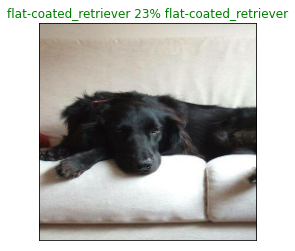

In [0]:
plot_pred(prediction_probabilities=predictions,truth_labels=val_label,images=val_image,n=20)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [0]:
a=np.array([55,75,95,15,35,25,45])
a

array([55, 75, 95, 15, 35, 25, 45])

In [0]:
a[-3:]

array([35, 25, 45])

In [0]:
a[-3:][::-1]

array([45, 25, 35])

In [0]:
a.argsort()  # index number from small to big

array([3, 5, 4, 6, 0, 1, 2])

In [0]:
a.argsort()[::-1]# index number from big to to small

array([2, 1, 0, 6, 4, 5, 3])

#### Function to plot top 10

In [0]:
def plot_pred_conf(prediction_probabilities,truth_label,n=1):
  '''
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n],truth_label[n]

  #Get prediction label
  pred_label = get_pred_label(pred_prob)
  

  # find top 10 prdiction confidence index
  top_10_prediction_index = pred_prob.argsort()[-10:][::-1]
 

  # top_10_prediction confidence value
  top_10_prediction_value = pred_prob[top_10_prediction_index]

  #top 10 prediction  label
  top_10_prediction_label = unique_breed[top_10_prediction_index]
 


  # set_up Plot
  top_plot = plt.bar(np.arange(len(top_10_prediction_label)),
                     top_10_prediction_value,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_prediction_label)),
             top_10_prediction_label,
             rotation='vertical')
  
 
  
  # Chane colour of the true lavel
  if np.isin(true_label,top_10_prediction_label):
    top_plot[np.argmax(top_10_prediction_label == true_label)].set_color('green')
  else:
    pass

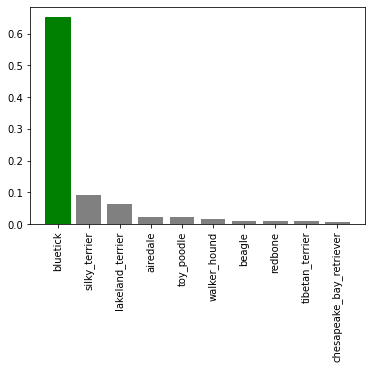

In [0]:
plot_pred_conf(predictions,val_label,n=3)

Wonderful! Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

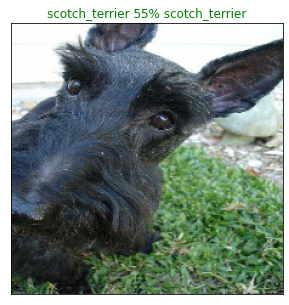

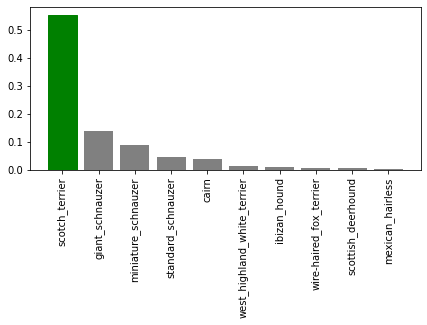

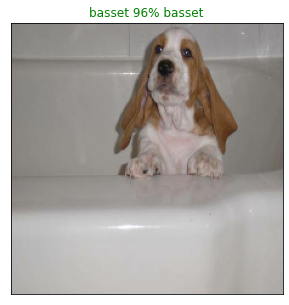

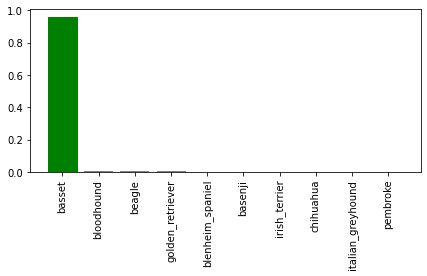

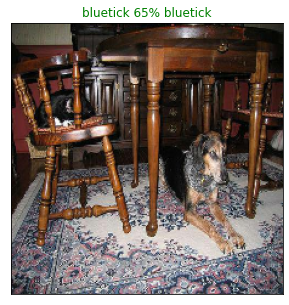

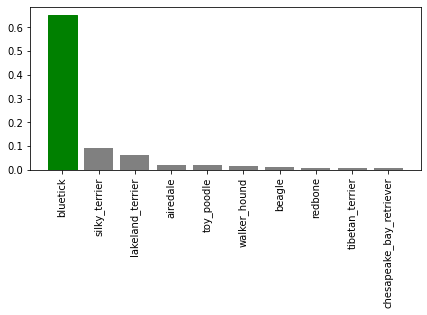

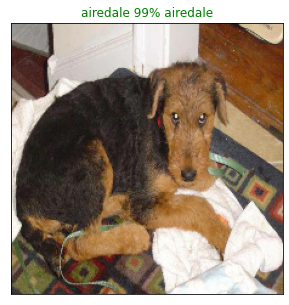

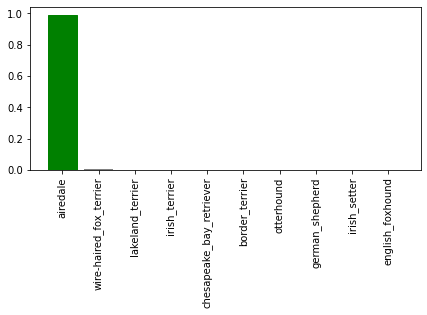

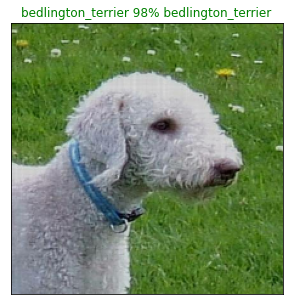

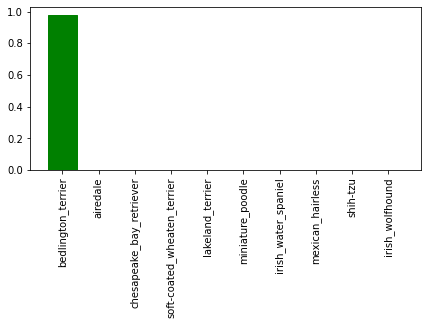

In [0]:


for i in range(5):
  plt.subplots(figsize=(5,5))
  plot_pred(predictions,
          val_label,
          val_image,n=i+1)
  
  plt.subplots(figsize=(7,3))
  plot_pred_conf(predictions,
                 val_label,n=i+1)
  
plt.show()  


## Save and load a model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.
#### Function to save a model

In [0]:
# let's create a function to save model
def save_model(model,suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.

  '''

  model_dir = os.path.join('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model',
                           datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  modelpath = model_dir + '-' + suffix + '.h5'  # save formate of model
  model.save(modelpath)
  print(f'model is saving in {modelpath}')
  return modelpath


In [0]:
# save it
save_model(model,suffix='trained with 1000 images-mobilenetv2-Adam')

model is saving in /content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-18331588358002-trained with 1000 images-mobilenetv2-Adam.h5


'/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-18331588358002-trained with 1000 images-mobilenetv2-Adam.h5'

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

#### Function to load a model

In [0]:
def load_model(modelpath):
  '''
   Loads a saved model from a specified path.
  '''
  print(f'Loading model from {modelpath}')
  model = tf.keras.models.load_model(modelpath,
                                     custom_objects={"KerasLayer":hub.KerasLayer}
                                     )
  return model



In [0]:
load_1000_trained_model = load_model('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-18331588358002-trained with 1000 images-mobilenetv2-Adam.h5')

Loading model from /content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-18331588358002-trained with 1000 images-mobilenetv2-Adam.h5


let's check if it works

In [0]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [0]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 154ms/step - loss: 1.3043 - accuracy: 0.6850


[1.3043444156646729, 0.6850000023841858]

In [0]:
load_1000_trained_model.evaluate(valid_data)

7/7 [==============================] - 1s 154ms/step - loss: 1.3043 - accuracy: 0.6850


[1.3043444156646729, 0.6850000023841858]

# Traing model on Full Dataset

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [0]:
len(X), len(y)

(10222, 10222)

There we go! We've got over 10,000 images and labels in our training set.

Before we can train a model on these, we'll have to turn them into a data batch.

The beautiful thing is, we can use our `create_data_batches()` function from above which also preprocesses our images for us (thank you past us for writing a helpful function).

In [0]:
# Create databatches on full set
full_data_batch = create_data_batches(X,y)

Creating Trainig data batches


In [0]:
full_data_batch.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

Our data is in a data batch, all we need now is a model.

And surprise, we've got a function for that too! Let's use `create_model()` to instantiate another model. 

In [0]:
# Create model on full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [0]:
# full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# NO validation set when training on all data, So we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping('accuracy',
                                                             patience = 3)

**Note:** Since running the cell below will cause the model to train on all of the data (10,000+) images, it may take a fairly long time to get started and finish. However, thanks to our `full_model_early_stopping` callback, it'll stop before it starts going too long.

Remember, the first epoch is always the longest as data gets loaded into memory. After it's there, it'll speed up.

In [0]:
# full_model.fit(x=full_data_batch,
#                epochs=100,
#                callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 7453s 23s/step - loss: 1.3187 - accuracy: 0.6689
Epoch 2/100
320/320 [==============================] - 68s 213ms/step - loss: 0.3993 - accuracy: 0.8810
Epoch 3/100
320/320 [==============================] - 70s 218ms/step - loss: 0.2352 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 73s 228ms/step - loss: 0.1544 - accuracy: 0.9633
Epoch 5/100
320/320 [==============================] - 73s 227ms/step - loss: 0.1056 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 72s 226ms/step - loss: 0.0773 - accuracy: 0.9872
Epoch 7/100
320/320 [==============================] - 72s 225ms/step - loss: 0.0591 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 71s 223ms/step - loss: 0.0448 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 72s 226ms/step - loss: 0.0373 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 71s 223m

In [0]:
# save_model(full_model,suffix='trained with full images-mobilenetv2-Adam')

model is saving in /content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-21501588369839-trained with full images-mobilenetv2-Adam.h5


'/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-21501588369839-trained with full images-mobilenetv2-Adam.h5'

In [0]:
%tensorboard --logdir /content/drive/My\ Drive/Machine_Learning_with_python/Machine\ Learning\ Zero\ to\ Mastery\ ZTM/dog_vision/logs

# Loading full model

In [0]:
load_full_trained_model = load_model('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-21501588369839-trained with full images-mobilenetv2-Adam.h5')

Loading model from /content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model/20200501-21501588369839-trained with full images-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [0]:
import os
test_data = os.listdir('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/test')

In [0]:
test_data[:10]

['f1b2c118e65c95ba1a00d102787d19a6.jpg',
 'ecc4566304626790004cd2c3626218b6.jpg',
 'f56b3708592637432ac53d7f0684dfa8.jpg',
 'f538a1d1a9e50417ea346429ea3e940c.jpg',
 'ef5c93599bcc330fd9642266d9650309.jpg',
 'ec5329231ea816ef212b367bdd17d06c.jpg',
 'efd7f925e6ce41da800844e6aae03226.jpg',
 'ea057ca7f831d161d456091bf293e4b1.jpg',
 'eb641b6721c3d967b8e92313c943eba9.jpg',
 'ef627a04965eda29fc3761b1f663aef1.jpg']

In [0]:
# creating test data path
test_data_path = ['/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/test/' + filename for filename in test_data]

In [0]:
len(test_data_path)

10356

In [0]:
# creating test data batch

test_data_batch = create_data_batches(X=test_data_path,test_data=True)

Creating test data batches..


In [0]:
test_data_batch

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [0]:
# Predicting on test data batch
test_data_prediction = load_full_trained_model.predict(test_data_batch,verbose=1)

324/324 [==============================] - 4258s 13s/step


In [0]:
import numpy as np
import pandas as pd



In [0]:
#saving it to csv to nut making prediction again. it took 1h for me
np.savetxt('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model_preds/preds_array.csv',test_data_prediction,delimiter=',')

In [0]:

pred_df = pd.read_csv('/content/drive/My Drive/Machine_Learning_with_python/Machine Learning Zero to Mastery ZTM/dog_vision/model_preds/preds_array.csv')

In [0]:
pred_df

,2.224048876087181270e-05,1.916675046231830493e-06,5.375650289352051914e-05,1.380908906867261976e-05,3.196856996510177851e-04,3.803743311436846852e-05,3.978503518737852573e-04,9.394606575369834900e-03,9.395861066877841949e-03,9.109543561935424805e-01,5.713502559956395999e-06,2.760547613434027880e-05,2.201974421041086316e-04,4.890866111963987350e-04,3.949989913962781429e-04,1.871625572675839067e-04,6.376997134793782607e-06,2.866342256311327219e-04,7.376576104434207082e-05,2.124990896845702082e-05,5.173872523300815374e-06,2.303737419424578547e-04,4.414058366819517687e-06,8.186805644072592258e-06,3.386743192095309496e-04,7.675038432353176177e-06,4.841900226892903447e-05,3.386578464414924383e-04,8.916540537029504776e-06,6.178879993967711926e-05,6.214695076778298244e-06,4.017761966679245234e-06,2.606119596748612821e-05,8.227976650232449174e-06,1.806918407964985818e-05,6.407349701476050541e-06,3.572482091840356588e-05,3.495277633192017674e-05,2.137558112735860050e-05,4.691787436604499817e-02,...,5.781187155662337318e-06,4.749299841932952404e-05,2.475131259416230023e-05,2.135786489816382527e-04,4.772216489072889090e-04,5.511927884072065353e-05,4.837220476474612951e-04,4.296451152185909450e-06,2.468224556650966406e-05,6.691981106996536255e-04,3.484218541416339576e-05,4.590282333083450794e-05,4.461388743948191404e-05,8.911327313398942351e-05,1.744267137837596238e-06,3.918875336239580065e-06,4.806199649465270340e-05,5.751236676587723196e-05,2.467756348778493702e-05,2.193077962147071958e-04,5.569247878156602383e-05,2.646317079779691994e-05,9.793871868168935180e-05,4.904928118776297197e-06,6.370162736857309937e-05,7.762258974253199995e-06,1.843517929955851287e-05,4.247445303917629644e-06,2.842761432475526817e-06,2.497960122127551585e-05,2.133690395567100495e-05,7.801972678862512112e-04,2.249636418127920479e-05,6.444816011935472488e-03,3.761429616133682430e-05,3.139835098409093916e-05,4.063725282321684062e-05,4.375765274744480848e-05,3.876674454659223557e-04,7.148842560127377510e-04
0,0.000058,0.000034,4.997251e-03,6.266823e-06,0.000104,0.000008,0.000218,0.001757,0.000084,0.000028,0.000270,0.000002,0.000136,0.000002,0.000030,0.000029,0.000092,0.000005,0.000189,0.005094,0.000011,0.000773,1.247255e-05,0.000097,0.000207,0.000333,0.000242,0.006052,0.000148,0.000259,0.000044,0.000036,0.000034,0.001437,0.000024,7.220739e-07,0.000146,0.004755,0.003221,0.000264,...,0.000038,0.000005,0.000093,0.000040,0.001266,0.000001,0.000799,0.000002,0.000024,0.000053,0.000296,0.000037,0.000204,0.000227,0.000366,0.000036,0.000701,0.000425,0.000068,0.000138,1.356706e-05,0.000407,0.000028,0.000273,0.000058,0.000074,0.000015,0.000002,0.000021,0.000023,2.173514e-05,0.006652,0.000860,0.001666,0.000711,0.000039,0.000176,0.004747,0.000160,0.000089
1,0.000039,0.000004,2.586240e-04,5.640279e-07,0.000018,0.000072,0.000008,0.000036,0.000008,0.000021,0.000003,0.000017,0.000009,0.000070,0.000025,0.000003,0.000055,0.000006,0.000106,0.000079,0.000006,0.000004,4.798730e-07,0.000003,0.000026,0.000005,0.000032,0.000438,0.000025,0.000185,0.000016,0.000002,0.000009,0.000109,0.000041,2.226175e-05,0.000015,0.000063,0.000005,0.000006,...,0.002732,0.000021,0.000022,0.000107,0.000017,0.000003,0.000021,0.000023,0.000027,0.000041,0.000009,0.000008,0.000013,0.000029,0.003868,0.000018,0.000024,0.000189,0.000003,0.000477,6.949315e-07,0.919230,0.000065,0.000002,0.000002,0.000002,0.000047,0.000001,0.000024,0.000054,7.664373e-07,0.000007,0.000003,0.000004,0.000005,0.000009,0.000021,0.000009,0.000027,0.000022
2,0.000052,0.000844,1.633826e-04,1.752370e-04,0.000040,0.000385,0.000014,0.000472,0.004262,0.000194,0.000087,0.137242,0.000590,0.052471,0.000065,0.000528,0.000540,0.000072,0.000383,0.000098,0.000135,0.000026,4.448847e-06,0.000020,0.003507,0.000274,0.000039,0.002522,0.000091,0.000259,0.000629,0.000519,0.058323,0.004114,0.004991,4.535116e-05,0.000044,0.000029,0.000804,0.000111,...,0.000102,0.000219,0.000543,0.000077,0.000279,0.000724,0.000004,0.000269,0.000110,0.000048,0.000012,0.000026,0.002

In [0]:
prediction_dataframe = pd.DataFrame(columns=['id']+ list(unique_breed))

In [0]:
prediction_dataframe

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
